Question 01

In [ ]:
def negative(r):
    s = 255 - r
    return s

Question 02


In [ ]:
import numpy as np
x_values = np.linspace(0, 255, 1000)


In [ ]:
y_values = negative(x_values)


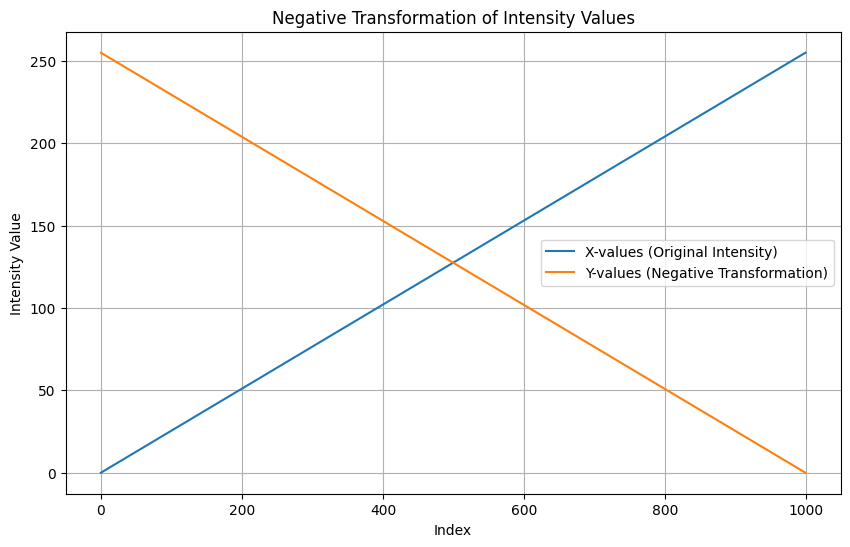

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(x_values, label='X-values (Original Intensity)')
plt.plot(y_values, label='Y-values (Negative Transformation)')
plt.title('Negative Transformation of Intensity Values')
plt.xlabel('Index')
plt.ylabel('Intensity Value')
plt.legend()
plt.grid(True)
plt.show()

Question 03

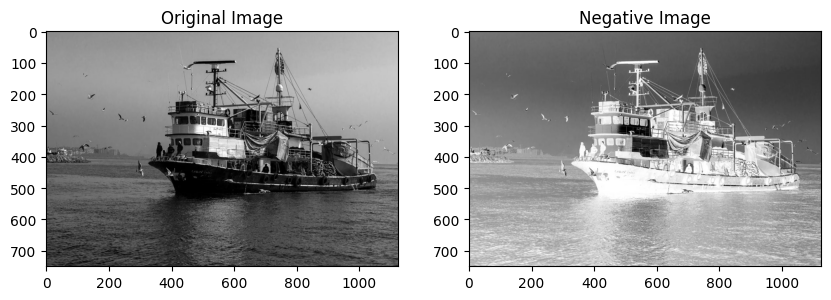

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

#read image

image=cv.imread('ship.jpeg')

#negative transformation on image

image_negative=255-image

#display images using matplotlib

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(image_negative)
plt.title('Negative Image')
plt.show()



Question 04

In [ ]:
def scale_image(input_img):
    min_val = input_img.min()
    max_val = input_img.max()

    # Normalize to 0-1 range
    normalized_img = (input_img - min_val) / (max_val - min_val)

    # Scale to 0-255 range and convert to uint8
    scaled_img = (normalized_img * 255).astype('uint8')
    return scaled_img

In [ ]:
import numpy as np
def logtransform(r, c=1):
    # Ensure r is float to avoid issues with log of 0 if r is an integer and contains 0
    r_float = r.astype(float) if isinstance(r, np.ndarray) else float(r)
    s = c * np.log(1 + r_float)
    return s

Question 05

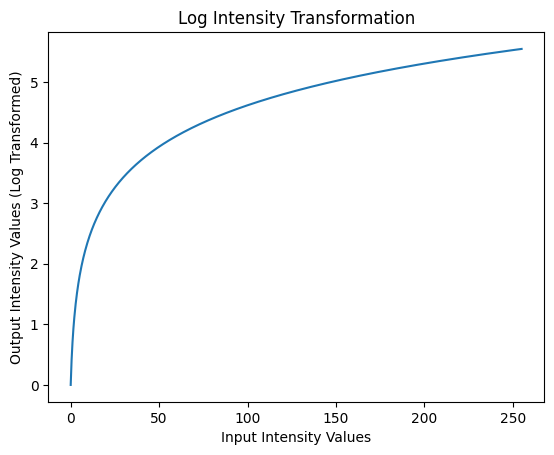

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


x_values = np.linspace(0, 255, 1000)


y_values = logtransform(x_values)


plt.plot(x_values, y_values)


plt.xlabel("Input Intensity Values")
plt.ylabel("Output Intensity Values (Log Transformed)")
plt.title("Log Intensity Transformation")

plt.show()

Question 06

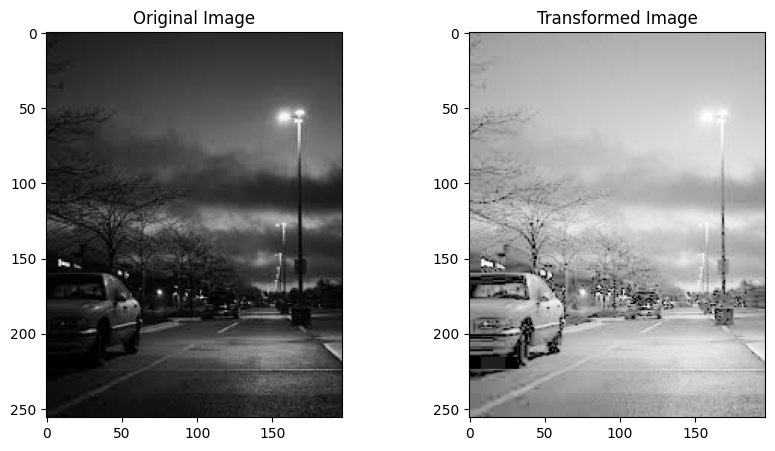

In [ ]:
#read image

roadimage=cv.imread('road.jfif')

#log transformation on image

roadimagelog=logtransform(roadimage)

#apply scaling_function

scaledroadimagelog=scale_image(roadimagelog)

#visualize original and trandformed images

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(roadimage)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(scaledroadimagelog)
plt.title('Transformed Image')
plt.show()


Question 07

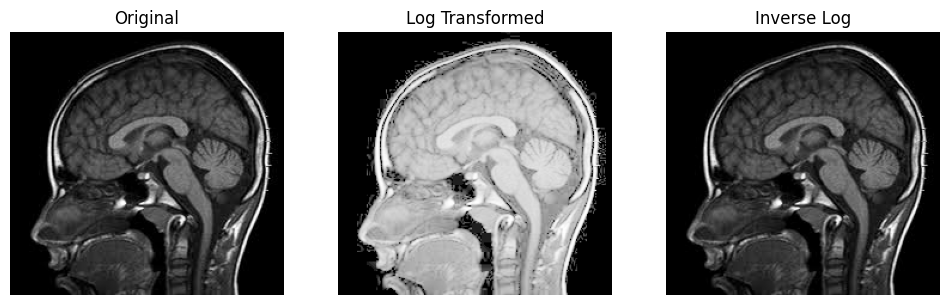

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Make sure logtransformation and inverse_log_transformation are defined, or redefine them if necessary.
# For the purpose of this subtask, I'll assume they are already defined in previous cells or available in the kernel.
# If not, I would re-include their definitions here or in a preceding cell.

def logtransformation(image):
    # Ensure image is not all zeros before calculating log
    if image.max() == 0:
        return np.zeros_like(image, dtype=np.uint8)
    c = 255 / np.log(1 + np.max(image.astype(float)))
    log_image = c * (np.log(image.astype(float) + 1))
    return np.array(log_image, dtype=np.uint8)

def inverse_log_transformation(image):
    c = 255 / np.log(1 + 255)
    # Ensure image is float for correct exponentiation
    inv_log_image = np.exp(image.astype(float) / c) - 1
    # Clip values to 0-255 range before casting to uint8
    inv_log_image = np.clip(inv_log_image, 0, 255)
    return np.array(inv_log_image, dtype=np.uint8)

# 1. Load the 'brain.jfif' image in grayscale
brain_image = cv2.imread('brain.jfif', 0)

# 2. Implement an if condition to check if brain_image is not None
if brain_image is None:
    print("Error: Image 'brain.jfif' not found or could not be loaded.")
else:
    # 3. Add another condition to check if brain_image.max() == 0
    if brain_image.max() == 0:
        print("Warning: The loaded image is entirely black and cannot be effectively processed.")
        # Display the black image if it's all black
        plt.figure(figsize=(4, 4))
        plt.imshow(brain_image, cmap='gray')
        plt.title('Original (All Black)')
        plt.axis('off')
        plt.show()
    else:
        # 4. Apply the logtransformation function
        brain_log_transformed = logtransformation(brain_image)

        # 5. Apply the inverse_log_transformation function
        brain_inverse_log_transformed = inverse_log_transformation(brain_log_transformed)

        # 6. Create a Matplotlib figure with a size of 12x4 inches.
        plt.figure(figsize=(12, 4))

        # 7. Display the images in a 1x3 subplot layout
        images = [brain_image, brain_log_transformed, brain_inverse_log_transformed]
        titles = ['Original', 'Log Transformed', 'Inverse Log']

        for i in range(3):
            plt.subplot(1, 3, i + 1)
            plt.imshow(images[i], cmap='gray')
            # 8. Set titles for each subplot
            plt.title(titles[i])
            # 9. Turn off the axis for each subplot
            plt.axis('off')
        # 10. Finally, display the plot
        plt.show()


Question 08

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('q8_sample.jpg')

(np.float64(-0.5), np.float64(1299.5), np.float64(866.5), np.float64(-0.5))

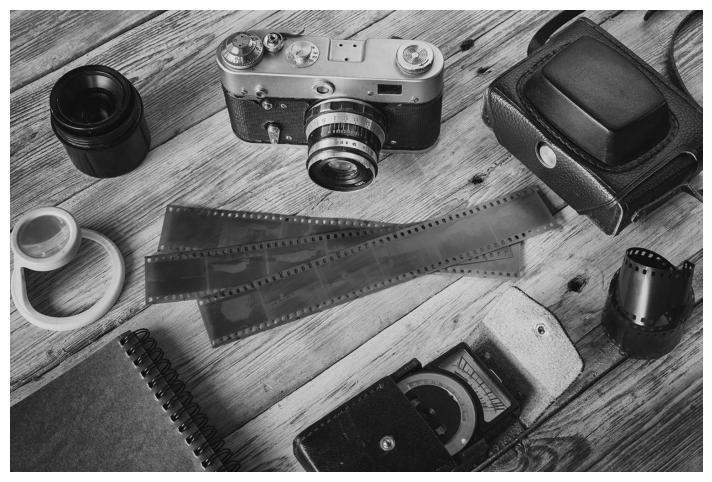

In [ ]:
plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis('off')

In [ ]:
def gammaTransform(r, gamma, c=1):
  s = c * (r ** gamma)
  return s

Gamma value set A: 0.2, 0.4, 0.6

In [ ]:
def scale_image(input_image):
  input_image = input_image / np.max(input_image)
  input_image = (input_image * 255).astype(int)
  return input_image

In [ ]:
def plot_results(input_image, output_img, x_values, y_values, title):
    plt.figure(figsize=(36, 12))

    plt.subplot(1,3,1)
    plt.imshow(input_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.plot(x_values, y_values)
    plt.title(f'{title} Function')
    plt.xlabel('Input Intensity Levels')
    plt.ylabel('Output Intensity Levels')

    plt.subplot(1,3,2)
    plt.imshow(output_img, cmap='gray')
    plt.title(f'{title} Image')
    plt.axis('off')

    plt.show()

Applying Gamma Transformation with gamma = 0.2


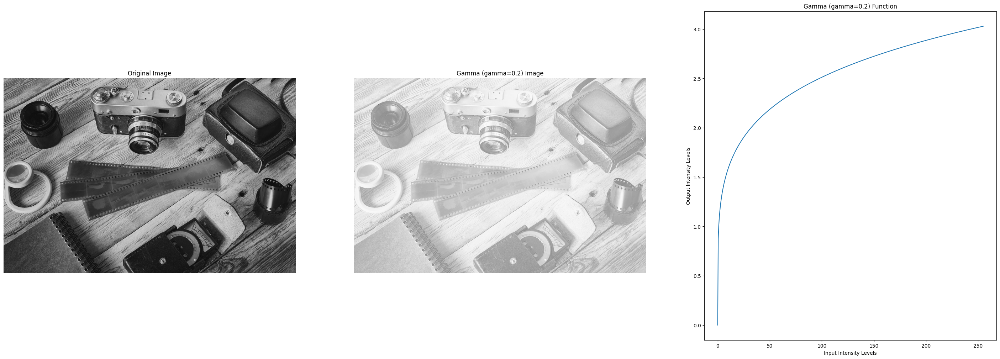

Applying Gamma Transformation with gamma = 0.4


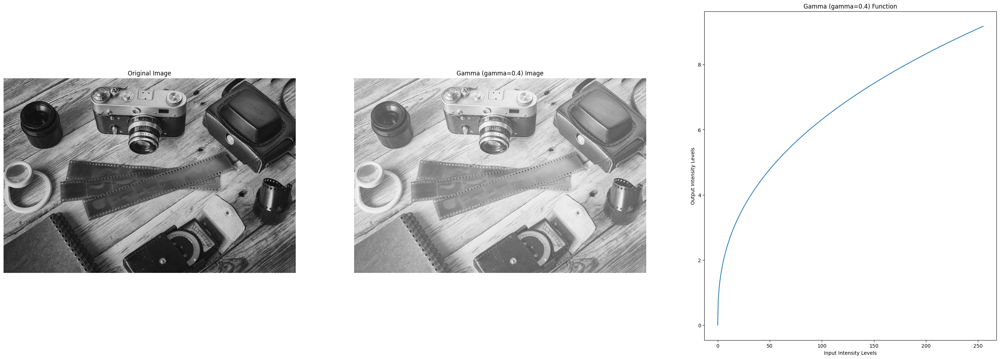

Applying Gamma Transformation with gamma = 0.6


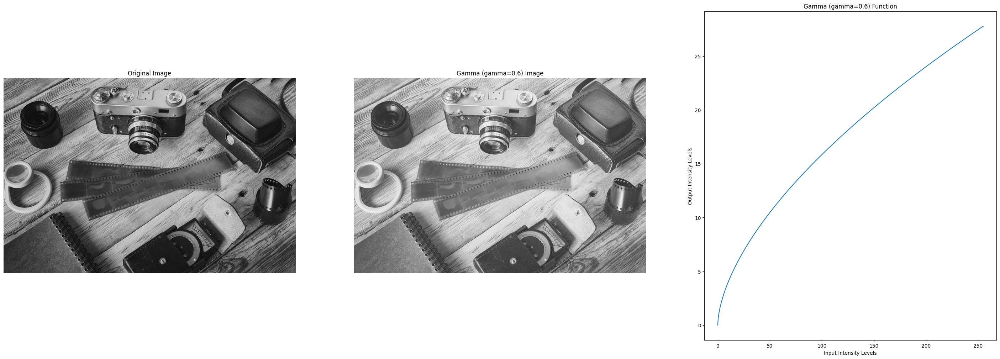

In [ ]:
gamma_values = [0.2, 0.4, 0.6]

for gamma in gamma_values:
  print(f"Applying Gamma Transformation with gamma = {gamma}")
  image_gamma = gammaTransform(image, gamma)
  image_gamma_scaled = scale_image(image_gamma)

  # required for plotting
  x_values_gamma = np.linspace(0, 255, 500)
  y_values_gamma = gammaTransform(x_values_gamma, gamma)

  plot_results(image, image_gamma_scaled, x_values_gamma, y_values_gamma, f'Gamma (gamma={gamma})')

Gamma value set B: 2.0, 4.0, 6.0

Applying Gamma Transformation with gamma = 2.0


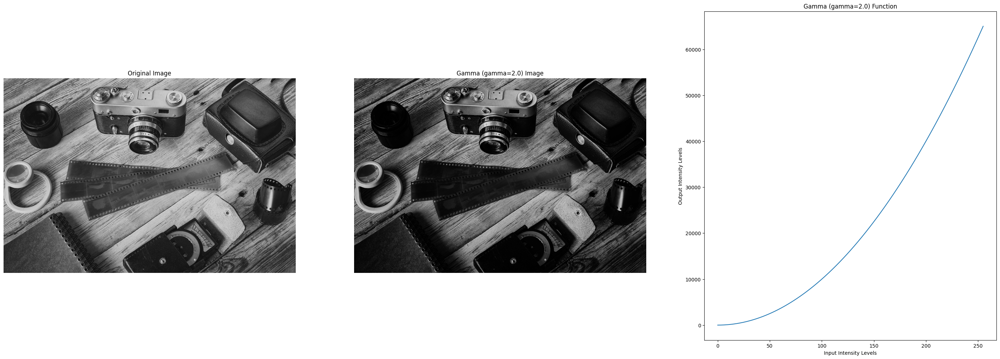

Applying Gamma Transformation with gamma = 4.0


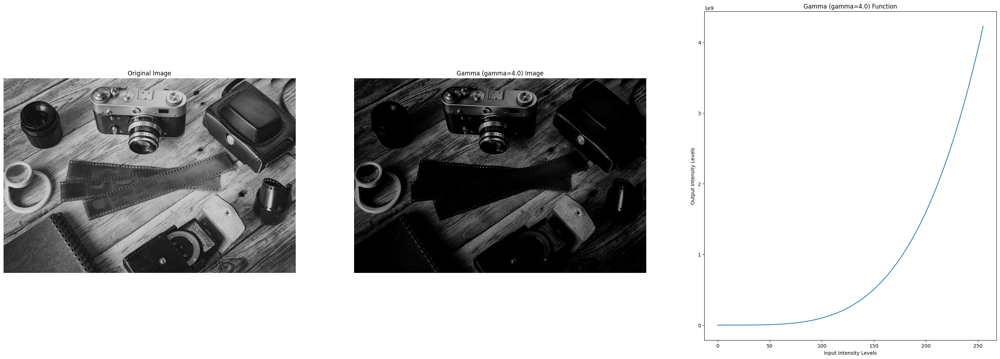

Applying Gamma Transformation with gamma = 6.0


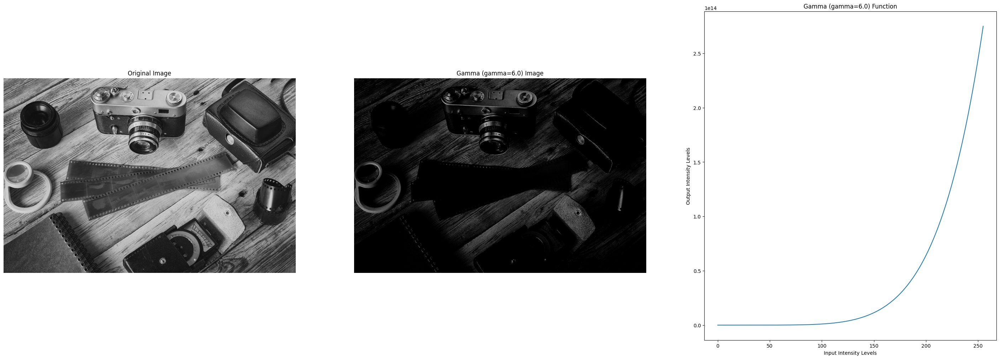

In [ ]:
gamma_values = [2.0, 4.0, 6.0]

for gamma in gamma_values:
  print(f"Applying Gamma Transformation with gamma = {gamma}")
  image_gamma = gammaTransform(image, gamma)
  image_gamma_scaled = scale_image(image_gamma)

  # required for plotting
  x_values_gamma = np.linspace(0, 255, 500)
  y_values_gamma = gammaTransform(x_values_gamma, gamma)

  plot_results(image, image_gamma_scaled, x_values_gamma, y_values_gamma, f'Gamma (gamma={gamma})')

Question 09

In [ ]:
image = cv2.imread('q9_sample.gif')

(np.float64(-0.5), np.float64(232.5), np.float64(237.5), np.float64(-0.5))

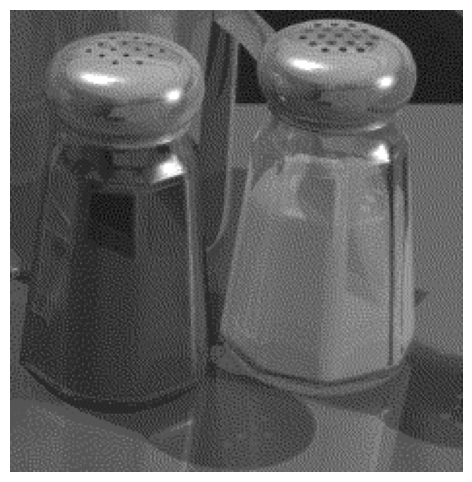

In [ ]:
plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis('off')

In [ ]:
def piecewiseLinear(r, r1, s1, r2, s2):
  if r < r1:
    s = (s1 / r1) * r
  elif r > r1 and r < r2:
    s = ((s2 - s1) / (r2 - r1) * (r - r1) + s1)
  else:
    s = ((255 - s2) / (255 - r2) * (r1 - r2) + s2)

  return int(s)

In [ ]:
piecewiseLinearVec = np.vectorize(piecewiseLinear)

In [ ]:
x_values = np.linspace(0, 255, 500)
y_values = piecewiseLinearVec(x_values, 80, 30, 150, 190)

In [ ]:
transformed_im = piecewiseLinearVec(image, 80, 30, 150, 190)

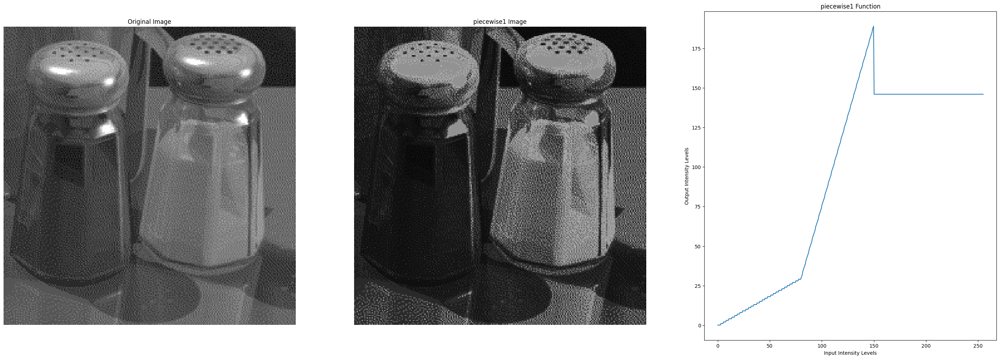

In [ ]:
plot_results(image, transformed_im, x_values, y_values, 'piecewise1')

In [ ]:
mean  = np.mean(image)
transformed_im2 = piecewiseLinearVec(image, mean, 0, mean, 255)

In [ ]:
x_values = np.linspace(0, 255, 500)
y_values = piecewiseLinearVec(x_values, mean, 0, mean, 255)

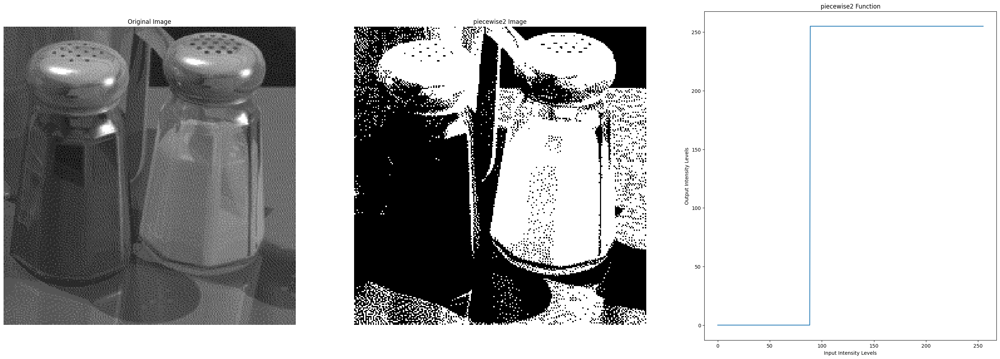

In [ ]:
plot_results(image, transformed_im2, x_values, y_values, 'piecewise2')

Question 10

In [56]:
image = cv2.imread('q10_sample.jpg')

(np.float64(-0.5), np.float64(696.5), np.float64(699.5), np.float64(-0.5))

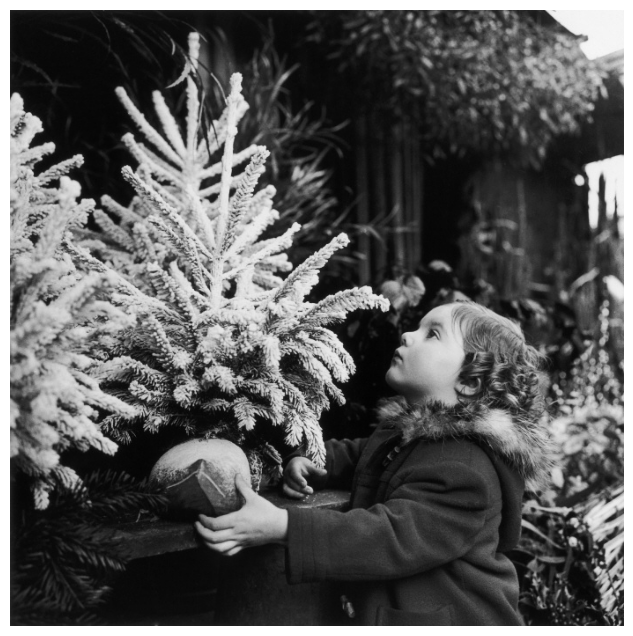

In [58]:
plt.figure(figsize=(10, 8))
plt.imshow(image)
plt.axis('off')

In [59]:
def intensityLevelTransform1(r):
  if r > 120 and r < 200:
    return 255
  else:
    return 0

In [60]:
intensityLevelTransform1Vec = np.vectorize(intensityLevelTransform1)

In [61]:
transform1 = intensityLevelTransform1Vec(image)

In [62]:
x_values = np.linspace(0, 255, 500)
y_values = intensityLevelTransform1Vec(x_values)

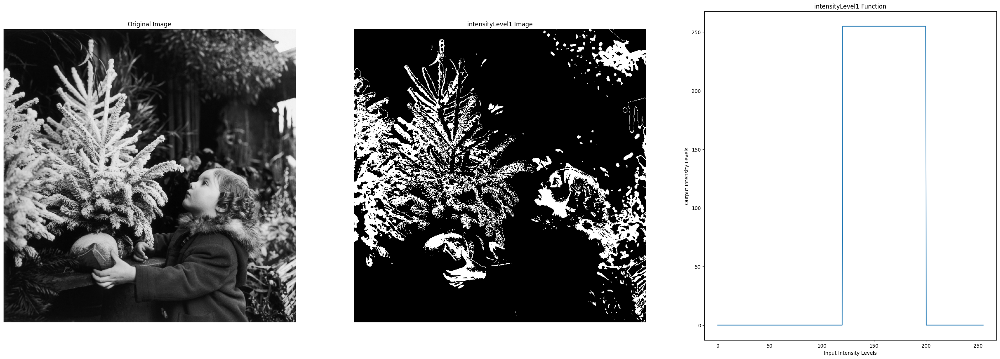

In [63]:
plot_results(image, transform1, x_values, y_values, 'intensityLevel1')

In [64]:
def intensityLevelTransform2(r):
  if r > 120 and r < 200:
    return 255
  else:
    return r

In [65]:
intensityLevelTransform2Vec = np.vectorize(intensityLevelTransform2)

In [66]:
transform2 = intensityLevelTransform2Vec(image)

In [67]:
x_values = np.linspace(0, 255, 500)
y_values = intensityLevelTransform2Vec(x_values)

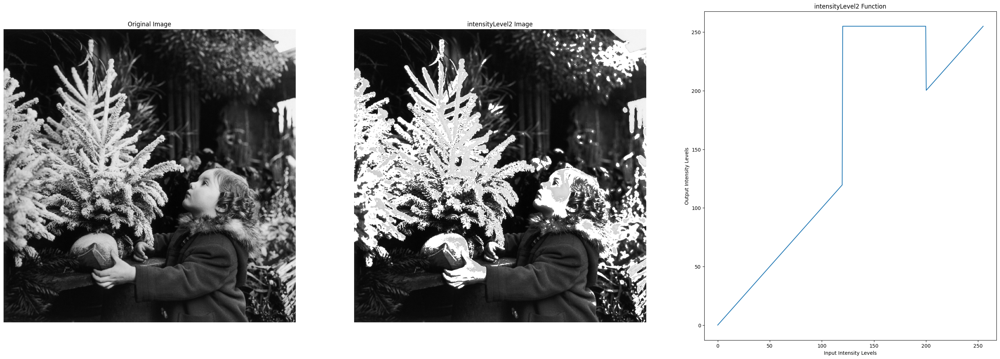

In [68]:
plot_results(image, transform2, x_values, y_values, 'intensityLevel2')